In [1]:
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Function to process images for clustering
def process_image(image_path):
     # Open and resize the image, and calculate the original size and unique colors
    image = Image.open(image_path)
    image = image.resize((256, 256))  # Resize image
    pixels = np.array(image)
    original_bytes = pixels.nbytes  # Calculate original size in bytes
    unique_colors = len(np.unique(pixels.reshape(-1, pixels.shape[2]), axis=0))  # Unique colors
    pixels_reshaped = pixels.reshape(-1, 3)  # Reshape for K-Means
    return image, pixels_reshaped, original_bytes, unique_colors

In [3]:
# Load and process images
image_paths = ['baboon.JPEG', 'bears.JPEG', 'dog.JPEG', 'lenna.JPEG', 'umbrealla.JPEG']
processed_images = []
bytes_info = []
unique_colors_info = []
reshaped_pixels=[]

# Process each image and store information
for path in image_paths:
    processed_image, pixels_reshaped, original_bytes, unique_colors = process_image(path)
    processed_images.append(processed_image)
    bytes_info.append(original_bytes)
    unique_colors_info.append(unique_colors)
    reshaped_pixels.append(pixels_reshaped)

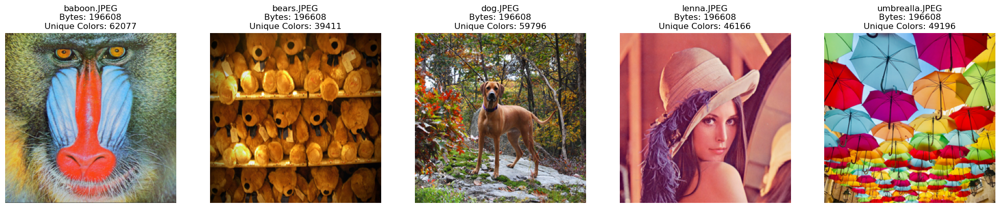

In [4]:
# Display original images with size and unique color information
fig, axs = plt.subplots(1, 5, figsize=(25, 25))
for i, img in enumerate(processed_images):
    axs[i].imshow(img)
    axs[i].set_title(f'{image_paths[i]}\nBytes: {bytes_info[i]}\nUnique Colors: {unique_colors_info[i]}')
    axs[i].axis('off')

plt.show()

In [5]:
# Functions to calculate WCSS and BCSS for clustering analysis
def calculate_wcss_bcss(pixels, centroids, labels):
    # Calculate WCSS (Within-Cluster Sum of Squares)
    wcss = sum(np.sum((pixels[labels == i] - centroids[i])**2) for i in range(centroids.shape[0]))

    # Calculate BCSS (Between-Cluster Sum of Squares)
    overall_mean = np.mean(pixels, axis=0)
    bcss = sum(len(pixels[labels == i]) * np.sum((centroids[i] - overall_mean)**2) for i in range(centroids.shape[0]))

    return wcss, bcss


In [6]:
# Function to calculate explained variance for clustering evaluation
def calculate_explained_variance(wcss, bcss):
    # Calculate total variance and explained variance
    total_variance = wcss + bcss
    explained_variance = bcss / total_variance if total_variance > 0 else 0
    return explained_variance


In [7]:
# Helper functions to convert RGB values to closest CSS3 color names
import webcolors
def closest_color(rgb):
    min_colors = {}
    for key, name in webcolors.CSS3_HEX_TO_NAMES.items():
        r_c, g_c, b_c = webcolors.hex_to_rgb(key)
        rd = (r_c - rgb[0]) ** 2
        gd = (g_c - rgb[1]) ** 2
        bd = (b_c - rgb[2]) ** 2
        min_colors[(rd + gd + bd)] = name
    return min_colors[min(min_colors.keys())]
def get_centroid_colors(centroids):
    color_names = set()
    for centroid in centroids:
        try:
            color_names.add(webcolors.rgb_to_name(centroid))
        except ValueError:
            color_names.add(closest_color(centroid))
    return color_names

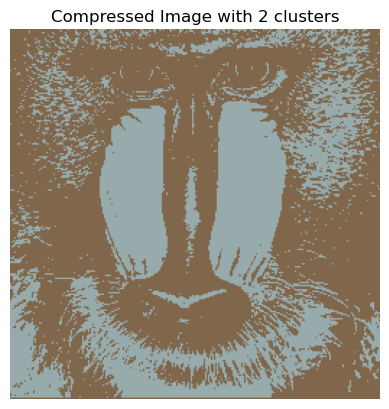

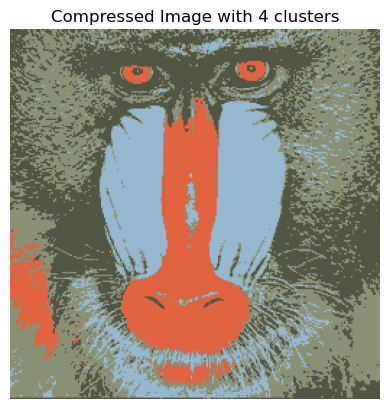

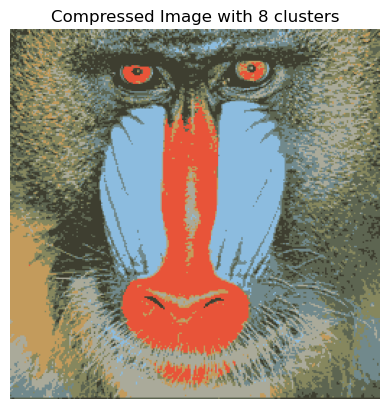

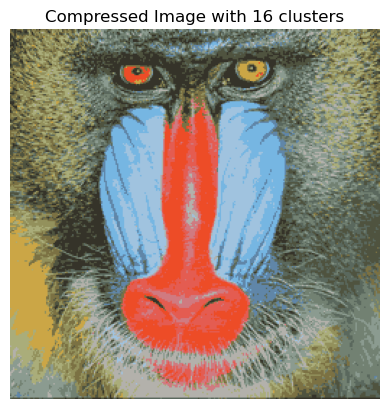

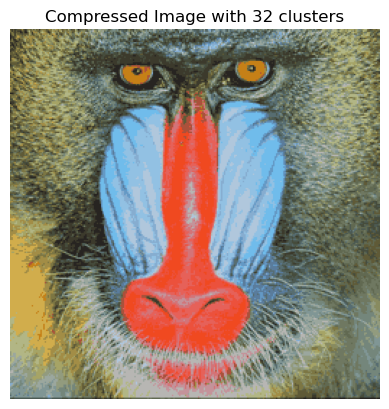

...

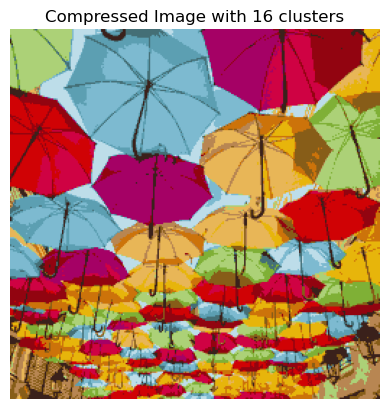

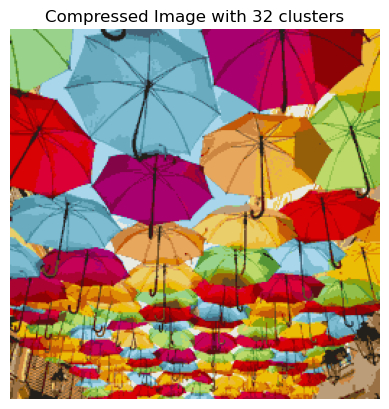

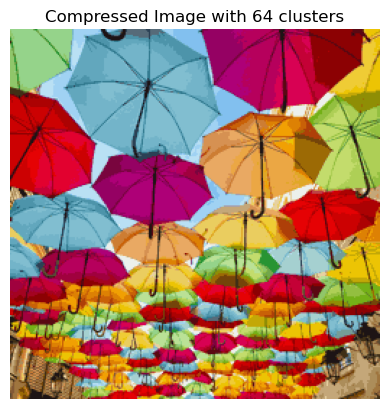

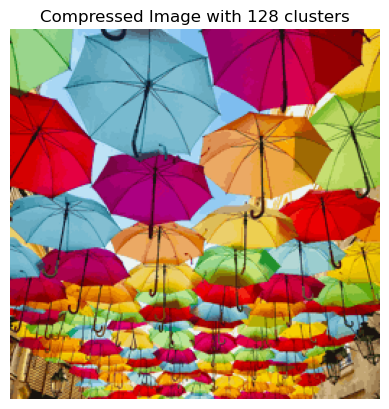

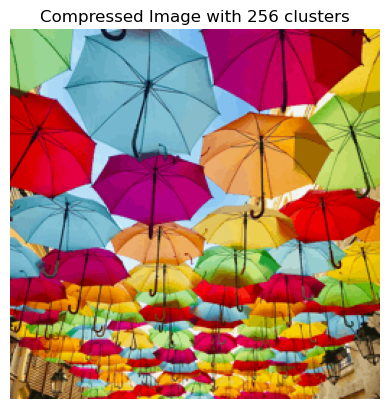

In [8]:
# Analyze images with KMeans clustering for different numbers of clusters
report = []
for i, img in enumerate(processed_images):
    results_for_image = []
    
    for k in [2**j for j in range(1, 9)]:
        # Initialize K-Means model
        kmeans = KMeans(n_clusters=k, n_init=10, random_state=0)
        kmeans.fit(reshaped_pixels[i])
        
        wcss, bcss = calculate_wcss_bcss(reshaped_pixels[i], kmeans.cluster_centers_, kmeans.labels_)
        explained_variance = calculate_explained_variance(wcss, bcss)

        centroid_colors = get_centroid_colors(kmeans.cluster_centers_.astype(int))
        compressed_size = np.ceil(np.log2(k)) * np.prod(processed_images[i].size[:2]) / 8
        results_for_image.append({
            'Image': image_paths[i],
            'Number of Clusters': k,
            'Centroid Colors': ', '.join(centroid_colors), 
            'WCSS': wcss,
            'BCSS': bcss,
            'Explained Variance': explained_variance,
            'Compressed Size': compressed_size
        })
        
        # Visualize compressed image
        compressed_image = kmeans.cluster_centers_[kmeans.labels_].reshape(256, 256, 3).astype(np.uint8)
        plt.imshow(compressed_image)
        plt.title(f'Compressed Image with {k} clusters')
        plt.axis('off')
        plt.show()
    
    report.extend(results_for_image)

In [9]:
# Convert clustering analysis report to DataFrame for easier handling
df_report = pd.DataFrame(report)


In [10]:
# Display the clustering analysis report in a table format
from IPython.display import HTML

# Start of the HTML content for the table
html_content = '''
<table>
<tr>
    <th>Image</th>
    <th>Clusters</th>
    <th>Centroid Colors</th>
    <th>WCSS</th>
    <th>BCSS</th>
    <th>Explained Variance</th>
    <th>Compressed Size</th>
</tr>
'''

for i, row in df_report.iterrows():
    color_list_html = f'''
    <details>
        <summary>View Colors</summary>
        {row['Centroid Colors']}
    </details>
    '''
    
    # Add the row information to the HTML content
    html_content += f'''
    <tr>
        <td>{row['Image']}</td>
        <td>{row['Number of Clusters']}</td>
        <td>{color_list_html}</td>
        <td>{row['WCSS']}</td>
        <td>{row['BCSS']}</td>
        <td>{row['Explained Variance']}</td>
        <td>{row['Compressed Size']}</td>
    </tr>
    '''

html_content += '</table>'

HTML(html_content)


Image,Clusters,Centroid Colors,WCSS,BCSS,Explained Variance,Compressed Size
baboon.JPEG,2,"View Colors darkgray, dimgray",299209798.8157345,221310725.470209,0.42517194835651445,8192.0
baboon.JPEG,4,"View Colors tomato, darkolivegreen, lightsteelblue, gray",120204163.18662708,399826086.64127105,0.7688515942555108,16384.0
baboon.JPEG,8,"View Colors gray, tomato, darkslategray, darkgray, skyblue, slategray, dimgray, darkkhaki",61587825.606516555,458746959.7590716,0.881638077371197,24576.0
baboon.JPEG,16,"View Colors indianred, gray, chocolate, darkolivegreen, peru, darkslategray, lightslategray, darkgray, palevioletred, skyblue, dimgray, darkkhaki, cadetblue, lightsteelblue",33208000.559121996,487200112.30165106,0.9361885417647087,32768.0
baboon.JPEG,32,"View Colors darkolivegreen, peru, orangered, indianred, olivedrab, rosybrown, darkslategray, silver, darkgoldenrod, tomato, lightslategray, sienna, dimgray, cadetblue, black, gray, palevioletred, darkgray, skyblue, slategray, darkkhaki, lightsteelblue",18832224.521983523,501358689.4265009,0.9637974750865247,40960.0
baboon.JPEG,64,"View Colors darkolivegreen, peru, orangered, indianred, cornflowerblue, lightcoral, rosybrown, olivedrab, darkslategray, darkseagreen, silver, steelblue, darkgoldenrod, tomato, lightslategray, sienna, dimgray, black, gray, chocolate, sandybrown, palevioletred, darkgray, skyblue, slategray, darkkhaki, lightsteelblue",11378191.644449336,508808974.20499575,0.9781267351610469,49152.0
baboon.JPEG,128,"View Colors darkolivegreen, peru, orangered, salmon, tan, indianred, cornflowerblue, rosybrown, olivedrab, darkslategray, darkseagreen, silver, steelblue, darkgoldenrod, tomato, lightslategray, sienna, darkslateblue, dimgray, cadetblue, saddlebrown, black, gray, chocolate, sandybrown, goldenrod, darkgray, palevioletred, skyblue, slategray, darkkhaki, lightsteelblue",7230799.1615241915,513113445.3490499,0.986103816391156,57344.0
baboon.JPEG,256,"View Colors darkolivegreen, peru, lightskyblue, orangered, tan, salmon, firebrick, indianred, cornflowerblue, lightcoral, rosybrown, olivedrab, darkslategray, brown, darkseagreen, silver, steelblue, darkgoldenrod, tomato, sienna, lightslategray, darkslateblue, dimgray, cadetblue, saddlebrown, black, gray, chocolate, goldenrod, darkgray, palevioletred, skyblue, slategray, darkkhaki, lightsteelblue",4588215.299037638,515590600.21783423,0.9911795421840112,65536.0
bears.JPEG,2,"View Colors darkgoldenrod, maroon",164332698.7607215,276377294.08693886,0.6271182831619473,8192.0
bears.JPEG,4,"View Colors chocolate, saddlebrown, black, goldenrod",59454365.17934614,380702374.536486,0.864924560242494,16384.0


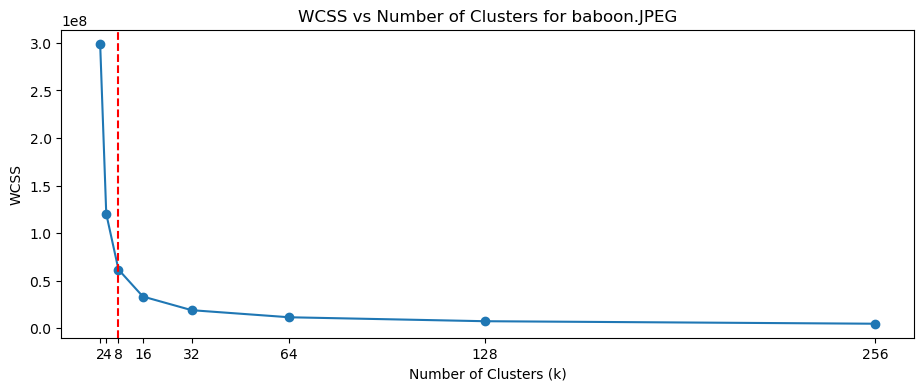

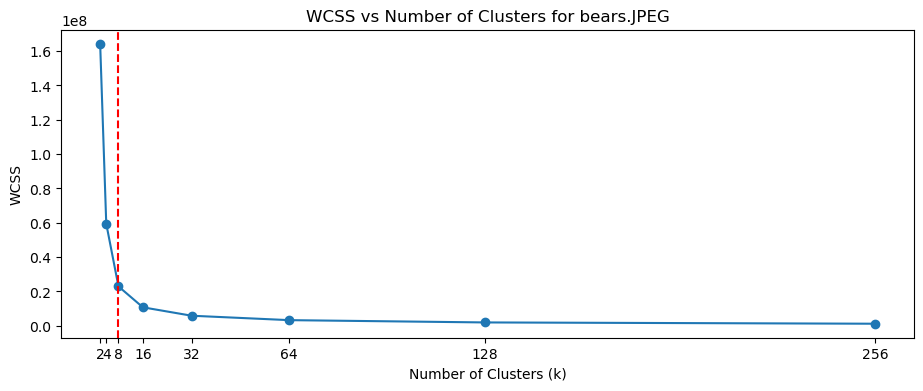

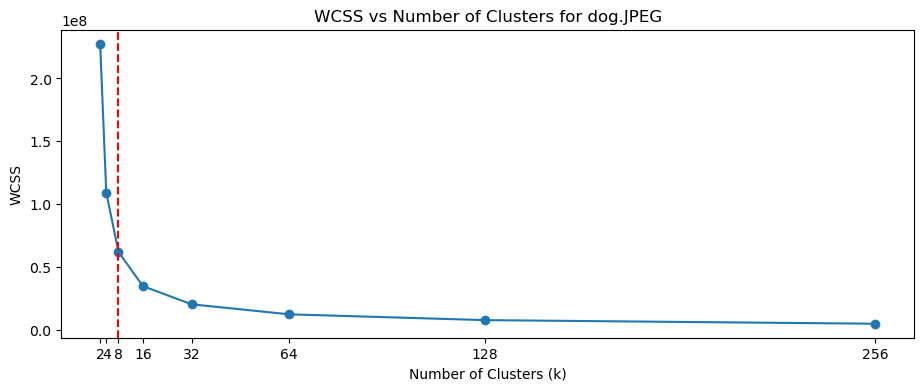

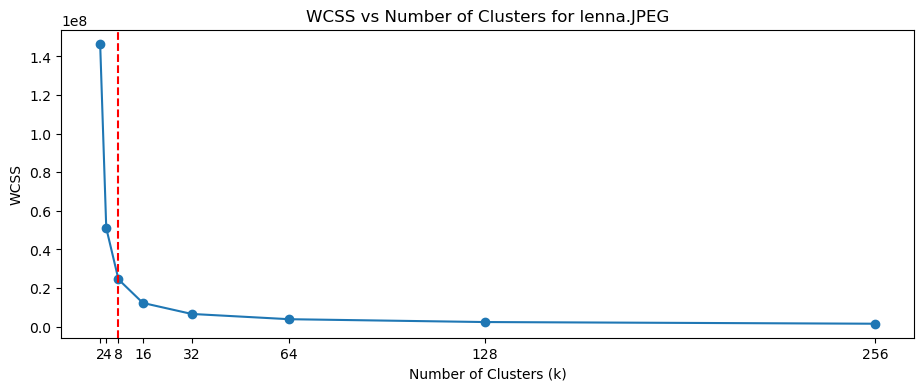

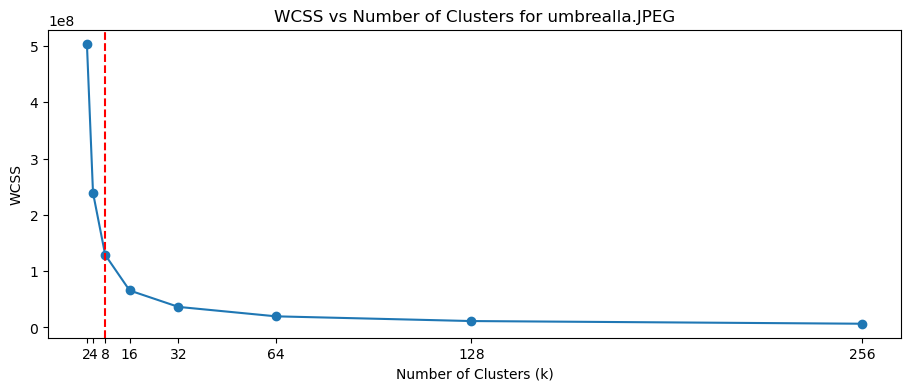

In [11]:
# Elbow method implementation to find the optimal number of clusters
def calculate_elbow(wcss_values):

    wcss_array = np.array(wcss_values)
    
    # Coordinates of the first point
    n_points = len(wcss_values)
    first_point = np.array([1, wcss_array[0]])
    
    # Coordinates of the last point
    last_point = np.array([n_points, wcss_array[-1]])
    
    # Line vector (from first to last point)
    line_vector = last_point - first_point
    
    # Normalize the line vector
    line_vector_norm = line_vector / np.linalg.norm(line_vector)
    
    # Vector from first point to each point
    point_vectors = np.array([np.array([i+1, wcss_array[i]]) - first_point for i in range(n_points)])
    
    # Project point vectors onto line vector and calculate distances to line
    distances = np.apply_along_axis(lambda x: np.linalg.norm(x - np.dot(x, line_vector_norm) * line_vector_norm), 1, point_vectors)
    
    # The elbow point is where the distance to the line is maximized
    elbow = np.argmax(distances) + 1 # Adding 1 to shift from index to count
    return elbow

elbow_points = {}
for i, img_path in enumerate(image_paths):
    wcss_values = [result['WCSS'] for result in report if result['Image'] == img_path]

    # Calculate the elbow point
    elbow = calculate_elbow(wcss_values)
    elbow_points[img_path] = elbow
    # Specify the cluster sizes as a list (powers of 2)
    cluster_sizes = [2**j for j in range(1, 9)]

    # Plotting WCSS values for visual inspection
    plt.figure(figsize=(11, 4))
    plt.plot(cluster_sizes, wcss_values, marker='o')
    plt.title(f"WCSS vs Number of Clusters for {img_path}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("WCSS")

    # Plot the elbow line - converting elbow index to actual cluster size
    plt.axvline(x=cluster_sizes[elbow-1], color='red', linestyle='--')
    plt.xticks(cluster_sizes, labels=cluster_sizes)  # Set x-axis ticks to actual cluster sizes
    plt.show()


In [12]:
# Print the determined elbow points for each image
print("Elbow Points for each image:")
for img_path, elbow in elbow_points.items():
    print(f"{img_path}: {2**elbow} clusters")

Elbow Points for each image:
baboon.JPEG: 8 clusters
bears.JPEG: 8 clusters
dog.JPEG: 8 clusters
lenna.JPEG: 8 clusters
umbrealla.JPEG: 8 clusters


In [13]:
# Comparing the original size with the compressed size using elbow points
size_comparison = []

for img_path in image_paths:
    original_size = bytes_info[image_paths.index(img_path)]
    optimal_clusters_elbow = 2**elbow_points[img_path]

    compressed_size = next((item['Compressed Size'] for item in report if item['Image'] == img_path and item['Number of Clusters'] == optimal_clusters_elbow), None)

    compression_ratio = original_size / compressed_size

    size_comparison.append({
        'Image': img_path,
        'Original Size (Bytes)': original_size,
        'Optimal Compressed Size (Bytes)': compressed_size,
        'Compression Ratio': compression_ratio
    })

df_size_comparison = pd.DataFrame(size_comparison)


In [14]:
# Displaying size comparison data
df_size_comparison

,Image,Original Size (Bytes),Optimal Compressed Size (Bytes),Compression Ratio
0,baboon.JPEG,196608,24576.0,8.0
1,bears.JPEG,196608,24576.0,8.0
2,dog.JPEG,196608,24576.0,8.0
3,lenna.JPEG,196608,24576.0,8.0
4,umbrealla.JPEG,196608,24576.0,8.0


In [15]:
# Combined metric for advanced cluster optimization
def combined_metric(explained_variance, compression_ratio, weight_for_variance, weight_for_compression):
    return weight_for_variance * explained_variance + weight_for_compression * compression_ratio

# Assigning weights and determining optimal clusters
weight_for_variance = 0.9
weight_for_compression = 0.0101

optimal_clusters = {}
for img_path in image_paths:
    best_metric = -1 
    best_cluster = None
    original_size = bytes_info[image_paths.index(img_path)]

    for k in [2**j for j in range(1, 9)]:
        entry = next((item for item in report if item['Image'] == img_path and item['Number of Clusters'] == k), None)

        if entry:
            compressed_size = entry['Compressed Size']
            compression_ratio = original_size / compressed_size if compressed_size else 0
            metric = combined_metric(entry['Explained Variance'], compression_ratio, weight_for_variance, weight_for_compression)

            if metric > best_metric:
                best_metric = metric
                best_cluster = k

    if best_cluster:
        optimal_clusters[img_path] = best_cluster

# Print the optimal number of clusters for each image
for img_path, clusters in optimal_clusters.items():
    print(f"{img_path}: Optimal number of clusters is {clusters}")


baboon.JPEG: Optimal number of clusters is 256
bears.JPEG: Optimal number of clusters is 16
dog.JPEG: Optimal number of clusters is 256
lenna.JPEG: Optimal number of clusters is 32
umbrealla.JPEG: Optimal number of clusters is 128


In [16]:
# Creating a DataFrame for comparison data between original and optimally compressed images
comparison_data = []

for img_path, clusters in optimal_clusters.items():
    original_size = bytes_info[image_paths.index(img_path)]
    optimal_entry = next(item for item in report if item['Image'] == img_path and item['Number of Clusters'] == clusters)
    optimal_compressed_size = optimal_entry['Compressed Size']
    
    compression_ratio = original_size / optimal_compressed_size if optimal_compressed_size else np.nan
    explained_variance = optimal_entry['Explained Variance']

    comparison_data.append({
        'Image': img_path,
        'Optimal Clusters': clusters,
        'Original Size (Bytes)': original_size,
        'Optimal Compressed Size (Bytes)': optimal_compressed_size,
        'Compression Ratio': compression_ratio,
        'Explained Variance': explained_variance
    })

df_comparison = pd.DataFrame(comparison_data)


In [17]:
# Displaying the comparison data between original and optimally compressed images

df_comparison

,Image,Optimal Clusters,Original Size (Bytes),Optimal Compressed Size (Bytes),Compression Ratio,Explained Variance
0,baboon.JPEG,256,196608,65536.0,3.000000,0.991180
1,bears.JPEG,16,196608,32768.0,6.000000,0.975587
2,dog.JPEG,256,196608,65536.0,3.000000,0.991325
3,lenna.JPEG,32,196608,40960.0,4.800000,0.983927
4,umbrealla.JPEG,128,196608,57344.0,3.428571,0.988886


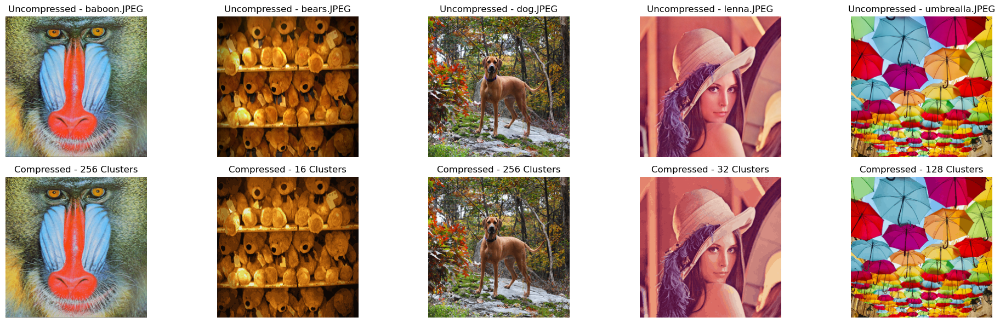

In [18]:
# Function to compress images using KMeans clustering with the optimal number of clusters
def compress_image(image_path, num_clusters):
    image = Image.open(image_path)
    image = image.resize((256, 256))
    pixels = np.array(image)
    pixels_reshaped = pixels.reshape(-1, 3)

    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=0)
    kmeans.fit(pixels_reshaped)

    compressed_pixels = kmeans.cluster_centers_[kmeans.labels_].reshape(256, 256, 3).astype(np.uint8)
    compressed_image = Image.fromarray(compressed_pixels)

    return compressed_image

# Visualizing uncompressed and compressed images side by side
fig, axs = plt.subplots(2, len(optimal_clusters),figsize=(20, 6))

for i, (image_path, clusters) in enumerate(optimal_clusters.items()):
    uncompressed_image = processed_images[i]
    compressed_image = compress_image(image_path, clusters)

    axs[0, i].imshow(uncompressed_image)
    axs[0, i].set_title(f'Uncompressed - {image_path}')
    axs[0, i].axis('off')

    axs[1, i].imshow(compressed_image)
    axs[1, i].set_title(f'Compressed - {clusters} Clusters')
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()